# **Data Acquisition and Extraction:**
### Extraction and analysis of key data from academic and research paper on optimization

### **Submitted By:**
- Kanupriya Jain
- Nan An
- Othman Hicheur

In [ ]:
!pip install keybert --quiet

In [ ]:
import requests
import xml.etree.ElementTree as ET
import re
from datetime import datetime
import os
from keybert import KeyBERT

d:\Data_aqusition_en\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


We first set up the environment for using GROBID, a machine-learning library for parsing scholarly documents. We import some basic modules and create directory for storing the outputs.The GROBID library's version 0.7.2 is downloaded as a ZIP file from its GitHub repository using wget. The downloaded file is extracted using unzip, and the working directory is switched to the extracted folder, grobid-0.7.2, preparing the environment for further configuration or execution of GROBID.

In [ ]:
# import os
# import requests
# import zipfile

# if not os.path.exists('output'):
#     os.mkdir('output')


# os.chdir('output')


# url = "https://github.com/kermitt2/grobid/archive/0.7.2.zip"
# zip_file_name = "0.7.2.zip"

# print(f"Downloading {url}...")
# response = requests.get(url)
# with open(zip_file_name, "wb") as f:
#     f.write(response.content)
# print("Download completed!")


# print("Extracting ZIP file...")
# with zipfile.ZipFile(zip_file_name, "r") as zip_ref:
#     zip_ref.extractall()
# print("Extraction completed!")


# os.chdir("grobid-0.7.2")
# print(f"Current working directory: {os.getcwd()}")


Download completed!
Extracting ZIP file...
Extraction completed!
Current working directory: d:\Data_aqusition_en\output\grobid-0.7.2


In [ ]:
# !./gradlew clean install --quiet

'.' �����ڲ����ⲿ���Ҳ���ǿ����еĳ���
���������ļ���


### **All Functions required for fetching data using API and GROBID**

First, We define  the process of retrieving, downloading, and analyzing scientific papers from **arXiv**, leveraging the GROBID library for detailed content extraction. It includes the following functions to:

1.**Query and Fetch Metadata:** Search for research papers on arXiv based on keywords using the arXiv API, extract metadata such as titles, abstracts, authors, publication dates, categories, and digital object identifiers (DOIs), and construct or retrieve PDF links.

2. **Download Papers:** Download PDFs of the research papers directly from arXiv.

3. **Process with GROBID:** Use GROBID-generated TEI XML files to extract structured data, such as the titles and bodies of sections within the paper and detailed references.

4. **Analyze Sections and References:** Parse TEI XML to identify sections (e.g., introduction, methodology) and bibliographic references, extracting information such as titles, authors, publication years, and associated URLs.


#### **Explanation of functions for Data Fetching and Extraction from arXIv using API**

we use the arXiv API to fetch metadata and links for research papers matching a specified query.

1. **Constructing the API Query:**
The `fetch_arxiv_paper_data` function builds a query URL using the search term (query) and the maximum number of results (`max_results`). This query is sent to the arXiv API, which returns an XML response containing metadata for the matching papers.

2. **Parsing the XML Response:**
The XML response is parsed using Python's `xml.etree.ElementTree` module. We try to navigate the hierarchical XML structure to locate `<entry>` elements, each representing a paper.

3. **Extracting Metadata:**
Within each `<entry>`, we try to extract fields such as the title, abstract, publication dates, authors, categories, DOIs, and links. This is done by finding the relevant XML tags using namespaces.

3. **Handling PDF Links:**
We try to construct one using the extracted article ID (from the paper's URL). The `extract_article_id` function extracts the ID using regular expressions, and `construct_pdf_url` generates the corresponding PDF link.

3. **Storing Paper Data:**
The extracted information for each paper is stored in a dictionary and added to a list, which is returned as the final result.

4. **Changing the date format:** The data format that we were getting from the paper was in the ISO 8601 format: `%Y-%m-%dT%H:%M:%SZ`. This format is commonly used in APIs so we reformatted using strftime into a new string with the format `%B %d, %Y`.



In [ ]:

def extract_article_id(arxiv_url):
    """
    Extracts the article ID from an arXiv URL.
    Example: http://arxiv.org/abs/1234.56789 -> 1234.56789
    """
    match = re.search(r'arxiv\.org/(?:abs|pdf)/([\w\.]+)', arxiv_url)
    if match:
        return match.group(1)
    return None

def construct_pdf_url(article_id):
    """
    Constructs the PDF URL using the extracted article ID.
    Example: 1234.56789 -> http://export.arxiv.org/pdf/1234.56789.pdf
    """
    return f"https://export.arxiv.org/pdf/{article_id}"

def fetch_arxiv_paper_data(query, max_results=5):

    url = f'http://export.arxiv.org/api/query?search_query=all:{query}&max_results={max_results}'
    response = requests.get(url)


    root = ET.fromstring(response.content)
    papers = []


    for entry in root.findall('{http://www.w3.org/2005/Atom}entry'):
        title = entry.find('{http://www.w3.org/2005/Atom}title').text
        summary = entry.find('{http://www.w3.org/2005/Atom}summary').text
        published_date = entry.find('{http://www.w3.org/2005/Atom}published').text
        updated_date = entry.find('{http://www.w3.org/2005/Atom}updated').text
        categories = [cat.attrib['term'] for cat in entry.findall('{http://www.w3.org/2005/Atom}category')]
        primary_category = entry.find('{http://arxiv.org/schemas/atom}primary_category').attrib['term']
        doi = entry.find('{http://arxiv.org/schemas/atom}doi').text if entry.find('{http://arxiv.org/schemas/atom}doi') is not None else None
        authors = [author.find('{http://www.w3.org/2005/Atom}name').text for author in entry.findall('{http://www.w3.org/2005/Atom}author')]
        link = entry.find('{http://www.w3.org/2005/Atom}id').text
        pdf_link = entry.find('{http://www.w3.org/2005/Atom}link[@title="pdf"]').attrib['href'] if entry.find('{http://www.w3.org/2005/Atom}link[@title="pdf"]') else None


        article_id = extract_article_id(link)
        if not pdf_link and article_id:
            pdf_link = construct_pdf_url(article_id)


        paper_data = {
            "title": title,
            "abstract": summary,
            "authors": authors,
            "published_date": published_date,
            "updated_date": updated_date,
            "categories": categories,
            "primary_category": primary_category,
            "doi": doi,
            "link": link,
            "pdf_link": pdf_link,
            "article_id": article_id
        }
        papers.append(paper_data)

    return papers



def reformat_date(raw_date):
    try:
        parsed_date = datetime.strptime(raw_date, "%Y-%m-%dT%H:%M:%SZ")
        return parsed_date.strftime("%B %d, %Y")
    except ValueError:
        return raw_date


#### **Explanation of Extracting Content and References from PDFs using GROBID**
We try to analyze the structure and content of scientific papers by processing TEI XML files generated by GROBID.

1. **Parsing TEI XML:**
Using Python's `xml.etree.ElementTree` library, we parse the TEI XML files generated by GROBID. These files represent the paper's content in a structured format.

2. **Extracting Sections:**
Sections are identified using `<div>` elements within the XML. Each section's title is extracted from `<head>` tags, and the body text is aggregated from `<p>` tags. We also defined a helper function `get_text` that is used to combine the text content from these elements, preserving structure.

3. **Extracting References:**
References are found within `<biblStruct>` elements in the XML.In this function, we are leaving out the first reference because it is the paper itself. For each reference, key details are extracted, including:

- **Title:** Located within `<title>` tags.
- **Authors:** Extracted from `<author>` tags, with individual names parsed from `<forename>` and `<surname>`.
- **Publication Year:** Found in `<date>` tags using the when attribute.
- **URL:** Extracted from <ptr> tags if present.
- **Handling Paper Metadata:** The first `<biblStruct>` element is typically the paper itself, which is skipped during reference extraction to focus on cited works.


In [ ]:
def download_pdf(pdf_url, save_path):
    """Download the PDF from the given URL."""
    response = requests.get(pdf_url)
    with open(save_path, 'wb') as f:
        f.write(response.content)


def get_text(element):
    """Extract text from an XML element."""
    text = ''
    for elem in element.iter():
        if elem.text:
            text += elem.text
        if elem.tail:
            text += elem.tail
    return text


class Section:
    def __init__(self, title="", body=""):
        self.title = title
        self.body = body

def extract_sections(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    sections = []
    for div in root.findall(".//{http://www.tei-c.org/ns/1.0}div"):
        section = Section()
        for elem in div:
            if elem.tag == "{http://www.tei-c.org/ns/1.0}head":
                section.title = elem.text
            if elem.tag == "{http://www.tei-c.org/ns/1.0}p":
                section.body += get_text(elem)
        if section.body:
            sections.append(section)
    return sections

GROBID_ENDPOINT = "http://localhost:8070/api/processFulltextDocument"
def process_pdf_with_grobid(pdf_path, output_dir, grobid_url=GROBID_ENDPOINT):
    os.makedirs(output_dir, exist_ok=True)
    pdf_file_name = os.path.basename(pdf_path)
    tei_file_path = os.path.join(output_dir, pdf_file_name.replace(".pdf", ".tei.xml"))


    if os.path.exists(tei_file_path):
        print(f"TEI XML already exists: {tei_file_path}")
        return tei_file_path

    # Call GROBID API
    with open(pdf_path, 'rb') as pdf_file:
        response = requests.post(
            grobid_url,
            files={"input": pdf_file},
            data={"consolidateCitations": "1"}
        )

    if response.status_code == 200:
        # Save the TEI XML file
        with open(tei_file_path, "w", encoding="utf-8") as tei_file:
            tei_file.write(response.text)
        print(f"TEI XML saved: {tei_file_path}")
        return tei_file_path
    else:
        print(f"Failed to process PDF with GROBID. Status code: {response.status_code}")
        return None


def extract_references_and_sections(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    references = []
    abstract = None
    conclusion = None

    biblStructs = root.findall(".//{http://www.tei-c.org/ns/1.0}biblStruct")
    for idx, biblStruct in enumerate(biblStructs):
        if idx == 0:  # Skip the first reference (because it was the the paper itself)
            continue
        reference_text = []

        # Extract reference title
        title = biblStruct.find(".//{http://www.tei-c.org/ns/1.0}title")
        if title is not None and title.text:
            reference_text.append(f"Title: {title.text}")

        # Extract authors
        authors = biblStruct.findall(".//{http://www.tei-c.org/ns/1.0}author")
        author_names = []
        for author in authors:
            forename = author.find(".//{http://www.tei-c.org/ns/1.0}forename")
            surname = author.find(".//{http://www.tei-c.org/ns/1.0}surname")
            full_name = []
            if forename is not None:
                full_name.append(forename.text)
            if surname is not None:
                full_name.append(surname.text)
            if full_name:
                author_names.append(" ".join(full_name))
        if author_names:
            reference_text.append(f"Authors: {', '.join(author_names)}")

        # Extract year
        date = biblStruct.find(".//{http://www.tei-c.org/ns/1.0}date")
        if date is not None and "when" in date.attrib:
            reference_text.append(f"Year: {date.attrib['when']}")

        # Extract URL
        ptr = biblStruct.find(".//{http://www.tei-c.org/ns/1.0}ptr")
        if ptr is not None and "target" in ptr.attrib:
            reference_text.append(f"URL: {ptr.attrib['target']}")

        references.append("; ".join(reference_text))

    # Extract Abstract and Conclusion
    for div in root.findall(".//{http://www.tei-c.org/ns/1.0}div"):
        head = div.find(".//{http://www.tei-c.org/ns/1.0}head")
        if head is not None:
            title = head.text.lower() if head.text else ""
            # if "abstract" in title:
            #     abstract = get_text(div)
            if "conclusion" in title:
                conclusion = get_text(div)

    return references, conclusion



def extract_keywords_keybert(text, top_n=10):
    """Extract keywords using KeyBERT."""
    kw_model = KeyBERT()
    keywords = kw_model.extract_keywords(text, top_n=top_n, keyphrase_ngram_range=(1, 2), stop_words='english')
    return keywords


## **Processing Files and saving them**

We now used the above function to extarct all the information using above defined functions. We query the arXiv API with a specified topic (e.g., "optimization" in this case) and retrieved a list of __ number of papers. Metadata such as titles, abstracts, authors, publication dates, and links are parsed and processed, with dates reformatted using the above defined functions. We print details of each paper  for review, and we create directory to store downloaded PDFs and further outputs. Finally, we downloads the PDF files using their respective links and saves them to the designated folder for subsequent use by GROBID.

### **1. Using API**

In [ ]:
query = "optimization"
max_results = 300
papers = fetch_arxiv_paper_data(query, max_results=max_results)

for paper in papers:
    paper["published_date"] = reformat_date(paper["published_date"])
    paper["updated_date"] = reformat_date(paper["updated_date"])
    print(f"Title: {paper['title']}")
    print(f"Abstract: {paper['abstract']}")
    print(f"Authors: {', '.join(paper['authors'])}")
    print(f"Published Date: {paper['published_date']}")
    print(f"Updated Date: {paper['updated_date']}")
    print(f"Categories: {', '.join(paper['categories'])}")
    print(f"Primary Category: {paper['primary_category']}")
    print(f"DOI: {paper['doi']}")
    print(f"Link: {paper['link']}")
    print(f"PDF Link: {paper['pdf_link']}")
    print(f"Article ID: {paper['article_id']}")
    print("-" * 80)



input_dir = "D:\Data_aqusition_en\content\pdfs"
output_dir = "D:\Data_aqusition_en\content\output"
os.makedirs(input_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)

for paper in papers:
    if paper["pdf_link"]:
        pdf_file_name = f"{paper['article_id']}.pdf"
        pdf_file_path = os.path.join(input_dir, pdf_file_name)


        print(f"Downloading PDF for {paper['title']}")
        download_pdf(paper["pdf_link"], pdf_file_path)


<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
C:\Users\80539\AppData\Local\Temp\ipykernel_25160\1529397613.py:26: SyntaxWarning: invalid escape sequence '\D'
  input_dir = "D:\Data_aqusition_en\content\pdfs"
C:\Users\80539\AppData\Local\Temp\ipykernel_25160\1529397613.py:27: SyntaxWarning: invalid escape sequence '\D'
  output_dir = "D:\Data_aqusition_en\content\output"
C:\Users\80539\AppData\Local\Temp\ipykernel_25160\146789706.py:38: DeprecationWarning: Testing an element's truth value will raise an exception in future versions.  Use specific 'len(elem)' or 'elem is not None' test instead.
  pdf_link = entry.find('{http://www.w3.org/2005/Atom}link[@title="pdf"]').attrib['href'] if entry.find('{http://www.w3.org/2005/Atom}link[@title="pdf"]') else None


Title: Personalized Optimization for Computer Experiments with Environmental
  Inputs
Abstract:   Optimization problems with both control variables and environmental variables
arise in many fields. This paper introduces a framework of personalized
optimization to han- dle such problems. Unlike traditional robust optimization,
personalized optimization devotes to finding a series of optimal control
variables for different values of environmental variables. Therefore, the
solution from personalized optimization consists of optimal surfaces defined on
the domain of the environmental variables. When the environmental variables can
be observed or measured, personalized optimization yields more reasonable and
better solution- s than robust optimization. The implementation of personalized
optimization for complex computer models is discussed. Based on statistical
modeling of computer experiments, we provide two algorithms to sequentially
design input values for approximating the optimal surfa

#### **Remark about citations:**

One thing we can observe here is that we are getting DOI as None for all the papers. We wanted to extract the citations data as well. We tried to use CrossRef or Semantic scholar. CrossRef API requires DOI get the data about citations and Semantic Scholar needs API Key and they have paused their service for some time so we were unable to extract this data.

### **2. Processing with GROBID**

- We first run GROBID, a tool designed to process PDFs, extract bibliographic data, and convert documents into TEI XML format. The command specifies the input directory (`-dIn`) containing the downloaded PDFs, the output directory (`-dOut`) to store the resulting XML files, and the task (`processFullText`) to extract full-text content and structure.

- `-Xmx4G`: Allocates 4GB of memory to the Java process for handling large PDFs.
GROBID processes the PDFs and generates corresponding .tei.xml files in the specified output directory.


In [ ]:
import os


current_directory = os.getcwd()

print(f"Current working directory: {current_directory}")


Current working directory: d:\Data_aqusition_en


In [ ]:
# !java -version
# !gradlew.bat --version

java version "23.0.1" 2024-10-15
Java(TM) SE Runtime Environment (build 23.0.1+11-39)
Java HotSpot(TM) 64-Bit Server VM (build 23.0.1+11-39, mixed mode, sharing)



------------------------------------------------------------
Gradle 7.1.1
------------------------------------------------------------

Build time:   2021-07-02 12:16:43 UTC
Revision:     774525a055494e0ece39f522ac7ad17498ce032c

Kotlin:       1.4.31
Groovy:       3.0.7
Ant:          Apache Ant(TM) version 1.10.9 compiled on September 27 2020
JVM:          23.0.1 (Oracle Corporation 23.0.1+11-39)
OS:           Windows 11 10.0 amd64



When extracting 300 PDFs locally, we used the Docker container with the grobid:0.8.1, which runs on the local port (8070). GROBID interacts with users via HTTP requests, allowing the upload of PDFs and retrieval of structured extraction results.

Using Docker containers provides several benefits, such as simplifying the setup process, it makes deployment and usage more efficient and less error-prone. We used this guideline https://grobid.readthedocs.io/en/latest/Grobid-docker/

In [ ]:
# Process PDFs with GROBID
#print("Processing PDFs with GROBID...")

#!java -Xmx4G -jar  grobid-core/build/libs/grobid-core-0.7.2-onejar.jar -gH grobid-home -dIn /content/pdfs/ -dOut /content/output -exe processFullText --quiet


Processing PDFs with GROBID...


Error: Unable to access jarfile grobid-0.7.2/grobid-core/build/libs/grobid-core-0.7.2-onejar.jar


- Now, we iterate through the list of papers fetched earlier, checking if an article ID is available. For each paper, we constructs the path to the TEI XML file based on the article ID and check if the XML file exists in the output directory.

- If the XML file is found, The `extract_sections` function is used to parse the XML file and extract the structured sections of the paper, including titles and body text.The `extract_references` function parses the bibliography section of the XML file and lists all references cited in the paper.

- We then extract keywords using the KeyBERT library applied to the full_text of the paper.
- **Output:** For each paper:
          - The extracted sections (titles and truncated bodies) are printed.
          - The abstract (if available) is shown for quick review.
          - The keywords derived from the full text (or abstract) are displaye along with their scores.
          - The references from the paper's bibliography are listed.


In [ ]:
import os
import requests
from xml.etree import ElementTree as ET

GROBID_ENDPOINT = "http://localhost:8070/api/processFulltextDocument"

PDF_DIR = r"D:\Data_aqusition_en\content\pdfs"
OUTPUT_DIR = r"D:\Data_aqusition_en\content\output"

os.makedirs(OUTPUT_DIR, exist_ok=True)

for paper in papers:
    if paper["article_id"]:
        pdf_file_name = f"{paper['article_id']}.pdf"
        pdf_path = os.path.join(PDF_DIR, pdf_file_name)
        xml_path = process_pdf_with_grobid(pdf_path, OUTPUT_DIR)

        if xml_path and os.path.exists(xml_path):
            print(f"\nExtract begin for {paper['title']}")

            references, conclusion = extract_references_and_sections(xml_path)

            # Extract and print conclusion
            if conclusion:
                print(f"\nExtracted Conclusion:\n{conclusion}")
            else:
                print("\nNo Conclusion Found.")

            print("\nReferences:")
            for ref in references:
                print(ref)

            print(f"\nExtract end for {paper['title']}\n")



TEI XML saved: D:\Data_aqusition_en\content\output\1607.01664v1.tei.xml

Extract begin for Personalized Optimization for Computer Experiments with Environmental
  Inputs

No Conclusion Found.

References:
Title: Robust Optimization; Authors: Aharon Ben-Tal, Laurent El Ghaoui, Arkadi Nemirovski; Year: 2009-12-31
Title: Robust convex optimization; Authors: A Ben-Tal, A Nemirovski; Year: 1998
Title: Robust optimization: a comprehensive survey; Authors: H Beyer, B Sendhoff; Year: 2007
Title: A tutorial on Bayesian optimization of expensive cost functions, with application to active user modeling and hierarchical reinforcement learning; Authors: E Brochu, V Cora, N De Freitas; Year: 2010
Title: SDO: A statistical method for global optimization; Authors: D Cox, S John; Year: 1997
Title: Genetic algorithms for estimation problems with multiple optima, nondifferentiability, and other irregular features; Authors: R Dorsey, M Mayer; Year: 1995
Title: Uniform design: theory and application; Autho

## **Database Creation**


We are using  SQLite database to store and organize data extracted from research papers. We are creating the following tables.

**Articles Table:**

- id: Primary key
- title: String
- summary: Text
- published_date: Date
- updated_date: Date
- primary_category: String
- doi: String (nullable)
- link: String
- pdf_link: String (nullable)

**Authors Table:**

- id: Primary key
- name: String

**Article_Authors Table:**

- article_id: Foreign key to Articles
- author_id: Foreign key to Authors

**Categories Table:**
- id: Primary key
- term: String

**Article_Categories Table:**

- article_id: Foreign key to Articles
- category_id: Foreign key to Categories

**Article_References Table:**
- id: Primary key
- article_id: Foreign key to Articles (the citing paper)
- referenced_article_id: Foreign key to Articles (the cited paper, nullable if the cited paper isn't in the database)
- reference_title: String
- reference_doi: String (nullable)
- reference_link: String (nullable)

**Keywords Table:**

- id: Primary key
- keyword: String (e.g., "machine learning", "optimization")

**Article_Keywords Table:**

- id: Primary key
- article_id: Foreign key to Articles
- keyword_id: Foreign key to Keywords

**Sections Table:**

- id: Primary key
- article_id: Foreign key to Articles
- section_title: Title of the section (e.g., "Introduction")
- section_content: Full text of the section
- section_number: Order of the section in the document


**Conclusion Table:**
- id: Primary key
- article_id: Foreign key to the Articles table
- conclusion: Text content of the conclusion

#### **Creating tables**

In [ ]:
import os
print(os.getcwd())

d:\Data_aqusition_en


In [ ]:
import sqlite3


db_dir = r"D:\Data_aqusition_en\database"
os.makedirs(db_dir, exist_ok=True)
db_path = os.path.join(db_dir, "research_papers.db")
conn = sqlite3.connect(db_path)
cursor = conn.cursor()


cursor.execute("""
CREATE TABLE IF NOT EXISTS Articles (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    article_id TEXT UNIQUE,
    title TEXT,
    summary TEXT,
    published_date TEXT,
    updated_date TEXT,
    primary_category TEXT,
    doi TEXT,
    link TEXT,
    pdf_link TEXT
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Authors (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    name TEXT UNIQUE
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Article_Authors (
    article_id INTEGER,
    author_id INTEGER,
    FOREIGN KEY (article_id) REFERENCES Articles (id),
    FOREIGN KEY (author_id) REFERENCES Authors (id)
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Categories (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    term TEXT UNIQUE
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Article_Categories (
    article_id INTEGER,
    category_id INTEGER,
    FOREIGN KEY (article_id) REFERENCES Articles (id),
    FOREIGN KEY (category_id) REFERENCES Categories (id)
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Article_References (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    article_id INTEGER,
    referenced_article_id INTEGER,
    reference_title TEXT,
    reference_doi TEXT,
    reference_link TEXT,
    FOREIGN KEY (article_id) REFERENCES Articles (id),
    FOREIGN KEY (referenced_article_id) REFERENCES Articles (id)
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Keywords (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    keyword TEXT UNIQUE
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Article_Keywords (
    article_id INTEGER,
    keyword_id INTEGER,
    FOREIGN KEY (article_id) REFERENCES Articles (id),
    FOREIGN KEY (keyword_id) REFERENCES Keywords (id)
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Sections (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    article_id INTEGER,
    section_title TEXT,
    section_content TEXT,
    section_number INTEGER,
    FOREIGN KEY (article_id) REFERENCES Articles (id)
)
""")

cursor.execute("""
CREATE TABLE IF NOT EXISTS Conclusion (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    article_id INTEGER UNIQUE,
    conclusion TEXT,
    FOREIGN KEY (article_id) REFERENCES Articles (id)
)
""")


cursor.execute("""
CREATE TABLE IF NOT EXISTS Conclusion (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    article_id INTEGER UNIQUE,
    conclusion TEXT,
    FOREIGN KEY (article_id) REFERENCES Articles (id)
)
""")

conn.commit()


#### **Inserting Data**

In [ ]:
def insert_article(cursor, paper):
    cursor.execute("""
        INSERT OR IGNORE INTO Articles (article_id, title, summary, published_date, updated_date, primary_category, doi, link, pdf_link)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?)
    """, (
        paper["article_id"], paper["title"], paper["abstract"], paper["published_date"],
        paper["updated_date"], paper["primary_category"], paper["doi"], paper["link"], paper["pdf_link"]
    ))
    return cursor.lastrowid

def insert_conclusion(cursor, article_id, conclusion):
    cursor.execute("""
        INSERT OR REPLACE INTO Conclusion (article_id, conclusion)
        VALUES (?, ?)
    """, (article_id, conclusion))


def insert_authors(cursor, article_id, authors):
    for author in authors:
        cursor.execute("INSERT OR IGNORE INTO Authors (name) VALUES (?)", (author,))
        author_id = cursor.execute("SELECT id FROM Authors WHERE name = ?", (author,)).fetchone()[0]
        cursor.execute("INSERT OR IGNORE INTO Article_Authors (article_id, author_id) VALUES (?, ?)", (article_id, author_id))
def insert_categories(cursor, article_id, categories):
    for category in categories:
        cursor.execute("INSERT OR IGNORE INTO Categories (term) VALUES (?)", (category,))
        category_id = cursor.execute("SELECT id FROM Categories WHERE term = ?", (category,)).fetchone()[0]
        cursor.execute("INSERT OR IGNORE INTO Article_Categories (article_id, category_id) VALUES (?, ?)", (article_id, category_id))
def insert_sections(cursor, article_id, sections):
    for section_number, section in enumerate(sections, start=1):
        cursor.execute("""
            INSERT INTO Sections (article_id, section_title, section_content, section_number)
            VALUES (?, ?, ?, ?)
        """, (article_id, section.title, section.body, section_number))
def insert_references(cursor, article_id, references):
    for ref in references:

        cursor.execute("""
            INSERT INTO Article_References (article_id, referenced_article_id, reference_title, reference_doi, reference_link)
            VALUES (?, ?, ?, ?, ?)
        """, (article_id, None, ref, None, None))

def insert_keywords(cursor, article_id, keywords):
    for keyword in keywords:

        cursor.execute("SELECT id FROM Keywords WHERE keyword = ?", (keyword,))
        existing_keyword = cursor.fetchone()


        if existing_keyword is None:
            cursor.execute("INSERT INTO Keywords (keyword) VALUES (?)", (keyword,))
            keyword_id = cursor.lastrowid  # Get the id of the newly inserted keyword
        else:
            keyword_id = existing_keyword[0]  # Get the existing keyword's id

        # Insert the relationship between the article and the keyword into Article_Keywords
        cursor.execute("INSERT OR IGNORE INTO Article_Keywords (article_id, keyword_id) VALUES (?, ?)", (article_id, keyword_id))



#### **Data Processing and Storing**

In [ ]:
cursor.execute("PRAGMA table_info(Articles);")
columns = cursor.fetchall()
for column in columns:
    print(column)


(0, 'id', 'INTEGER', 0, None, 1)
(1, 'article_id', 'TEXT', 0, None, 0)
(2, 'title', 'TEXT', 0, None, 0)
(3, 'summary', 'TEXT', 0, None, 0)
(4, 'abstract', 'TEXT', 0, None, 0)
(5, 'conclusion', 'TEXT\n    published_date TEXT', 0, None, 0)
(6, 'updated_date', 'TEXT', 0, None, 0)
(7, 'primary_category', 'TEXT', 0, None, 0)
(8, 'doi', 'TEXT', 0, None, 0)
(9, 'link', 'TEXT', 0, None, 0)
(10, 'pdf_link', 'TEXT', 0, None, 0)


In [ ]:
conn.close()


In [ ]:
GROBID_ENDPOINT = "http://localhost:8070/api/processFulltextDocument"
PDF_DIR = r"D:\Data_aqusition_en\content\pdfs"
OUTPUT_DIR = r"D:\Data_aqusition_en\content\output"

os.makedirs(OUTPUT_DIR, exist_ok=True)

for paper in papers:


    article_id = insert_article(cursor, paper)  # Insert into Articles and get ID
    insert_authors(cursor, article_id, paper["authors"])  # Link authors
    insert_categories(cursor, article_id, paper["categories"])  # Link categories

    # Handle sections
    if paper["article_id"]:
        pdf_file_name = f"{paper['article_id']}.pdf"
        pdf_path = os.path.join(PDF_DIR, pdf_file_name)
        xml_path = process_pdf_with_grobid(pdf_path, OUTPUT_DIR)

        if xml_path and os.path.exists(xml_path):
            references, conclusion = extract_references_and_sections(xml_path)


            if conclusion:
                insert_conclusion(cursor, article_id, conclusion)

            insert_references(cursor, article_id, references)

            sections = extract_sections(xml_path)
            insert_sections(cursor, article_id, sections)

            # Combine all sections to create full text
            full_text = " ".join(section.body for section in sections)


            # Extract keywords from the full text
            print("\nExtracting keywords from full text:")
            keywords = extract_keywords_keybert(full_text, top_n=10)
            extracted_keywords = [word for word, score in keywords]
            insert_keywords(cursor, article_id, extracted_keywords)


conn.commit()


TEI XML already exists: D:\Data_aqusition_en\content\output\1607.01664v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\1908.05689v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\1304.2384v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\2108.11713v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\1110.3885v2.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\2411.09395v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\2103.03300v4.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output\1012.3592v1.tei.xml

Extracting keywords from full text:
TEI XML already exists: D:\Data_aqusition_en\content\output

In [ ]:
# Display all table names in the database
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()

# Print out the table names
for table in tables:
    print(table[0])

# Display the content of each table
for table in tables:
    table_name = table[0]
    print(f"\nContent of table: {table_name}")

    # Fetch all rows from the current table
    cursor.execute(f"SELECT * FROM {table_name}")
    rows = cursor.fetchall()

    # Display column names
    column_names = [description[0] for description in cursor.description]
    print("Columns:", column_names)

    # Display the rows
    for row in rows:
        print(row)


Articles
sqlite_sequence
Authors
Article_Authors
Categories
Article_Categories
Article_References
Keywords
Article_Keywords
Sections
Conclusion

Content of table: Articles
Columns: ['id', 'article_id', 'title', 'summary', 'published_date', 'updated_date', 'primary_category', 'doi', 'link', 'pdf_link']
(1, '1607.01664v1', 'Personalized Optimization for Computer Experiments with Environmental\n  Inputs', '  Optimization problems with both control variables and environmental variables\narise in many fields. This paper introduces a framework of personalized\noptimization to han- dle such problems. Unlike traditional robust optimization,\npersonalized optimization devotes to finding a series of optimal control\nvariables for different values of environmental variables. Therefore, the\nsolution from personalized optimization consists of optimal surfaces defined on\nthe domain of the environmental variables. When the environmental variables can\nbe observed or measured, personalized optimizat

## **Data Cleaning**

### **Checking for missing data**

We check if `title` and `published_date` are `NULL` in the `Articles` table

In [ ]:
cursor.execute("SELECT * FROM Articles WHERE title IS NULL OR published_date IS NULL")
missing_articles = cursor.fetchall()

print(f"Articles with missing data: {len(missing_articles)}")


Articles with missing data: 0


There are no such papers.

We check for missing references now in `Article_References`.

In [ ]:
cursor.execute("""
    SELECT * FROM Article_References
    WHERE article_id IS NULL
       OR reference_title IS NULL OR reference_title = ''
""")
missing_references = cursor.fetchall()

print(f"Missing data in References table: {len(missing_references)} rows")
for reference in missing_references:
    print(f"Article ID: {reference[1]}, Referenced Article ID: {reference[2]}, Title: {reference[3]}, DOI: {reference[4]}, Link: {reference[5]}")


Missing data in References table: 4 rows
Article ID: 32, Referenced Article ID: None, Title: , DOI: None, Link: None
Article ID: 32, Referenced Article ID: None, Title: , DOI: None, Link: None
Article ID: 32, Referenced Article ID: None, Title: , DOI: None, Link: None
Article ID: 278, Referenced Article ID: None, Title: , DOI: None, Link: None


We delete these references

In [ ]:
cursor.execute("""
    DELETE FROM Article_References
    WHERE reference_title IS NULL OR reference_title = ''
""")
conn.commit()

print(f"Deleted {cursor.rowcount} references with missing titles.")

Deleted 4 references with missing titles.


### **Removing Duplicates**

 We remove the papers,if there are duplicate `title` entries in the `Articles` table

In [ ]:

cursor.execute("""
    DELETE FROM Articles WHERE rowid NOT IN (
        SELECT MIN(rowid) FROM Articles GROUP BY title
    )
""")
conn.commit()

print("Removed duplicate articles based on title.")


Removed duplicate articles based on title.


### **Standardize Keywords Table**

We normalize the keyword field in the Keywords table by converting all keywords to lowercase.

In [ ]:
cursor.execute("UPDATE Keywords SET keyword = LOWER(keyword)")
conn.commit()

print("Normalized keywords to lowercase.")


Normalized keywords to lowercase.


### **Checking `sections` table**

We check for missing data in sections table

In [ ]:
cursor.execute("""
    SELECT * FROM Sections
    WHERE section_title IS NULL OR section_content IS NULL
""")
missing_sections = cursor.fetchall()

print(f"Sections with missing data: {len(missing_sections)}")



Sections with missing data: 0


In [ ]:

conn = sqlite3.connect('/content/research_papers.db')
cursor = conn.cursor()


cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()

print("Tables in the database:")
for table in tables:
    print(table[0])


    cursor.execute(f"PRAGMA table_info({table[0]})")
    columns = cursor.fetchall()


    print(f"Structure of {table[0]}:")
    for column in columns:
        print(f"  Column: {column[1]}, Type: {column[2]}, Not Null: {column[3]}, Default: {column[4]}, Primary Key: {column[5]}")

    print("-" * 40)

conn.close()


Tables in the database:
Articles
Structure of Articles:
  Column: id, Type: INTEGER, Not Null: 0, Default: None, Primary Key: 1
  Column: article_id, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: title, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: summary, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: published_date, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: updated_date, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: primary_category, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: doi, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: link, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
  Column: pdf_link, Type: TEXT, Not Null: 0, Default: None, Primary Key: 0
----------------------------------------
sqlite_sequence
Structure of sqlite_sequence:
  Column: name, Type: , Not Null: 0, Default: None, Primary Key: 0
  Column: seq, Type: , Not Null: 0, 

## **Visualization of Database**

### **Number Of paper published each year**

In [ ]:
import sys
!{sys.executable} -m pip install matplotlib pandas

^C


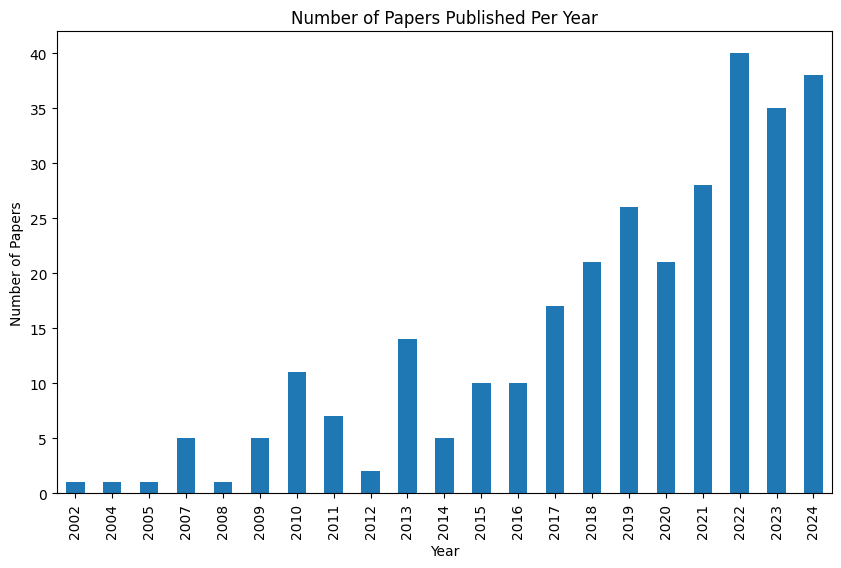

In [ ]:
import matplotlib.pyplot as plt
import sqlite3
import pandas as pd




db_dir = r"D:\Data_aqusition_en\database"
db_path = os.path.join(db_dir, "research_papers.db")
# db_path=r"research_papers.db"
conn = sqlite3.connect(db_path)


query = "SELECT published_date FROM Articles"
df = pd.read_sql(query, conn)

# Convert the published_date to datetime
df['published_date'] = pd.to_datetime(df['published_date'])

# Extract year and count papers per year
df['year'] = df['published_date'].dt.year
year_count = df.groupby('year').size()

# Plot the graph
plt.figure(figsize=(10, 6))
year_count.plot(kind='bar')
plt.title('Number of Papers Published Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Papers')
plt.show()


### **Top 10 Authors**

<Figure size 1000x600 with 0 Axes>

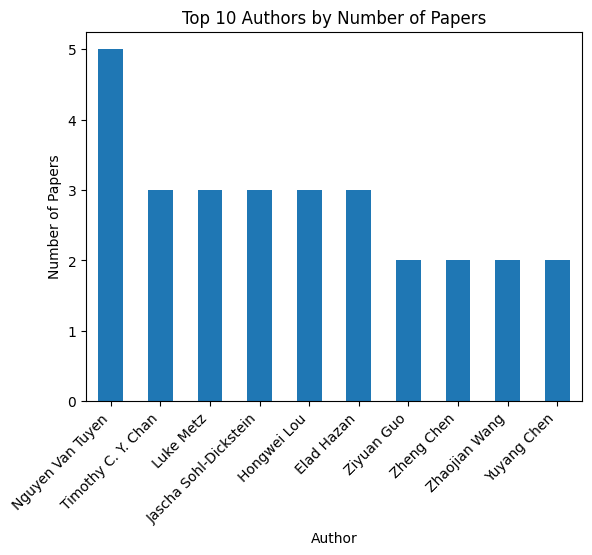

In [ ]:
# Get the most frequent authors
query = """
SELECT Authors.name, COUNT(Article_Authors.article_id) AS paper_count
FROM Authors
JOIN Article_Authors ON Authors.id = Article_Authors.author_id
GROUP BY Authors.name
ORDER BY paper_count DESC
LIMIT 10
"""
df = pd.read_sql(query, conn)

# Plot the graph
plt.figure(figsize=(10, 6))
df.plot(kind='bar', x='name', y='paper_count', legend=False)
plt.title('Top 10 Authors by Number of Papers')
plt.xlabel('Author')
plt.ylabel('Number of Papers')
plt.xticks(rotation=45, ha='right')
plt.show()


### **Category Distribution**

We retrieve the top 10 research paper categories (based on the number of papers in each category) and visualize this data with a bar chart. These visualizations help identify popular keywords and categories, providing insights into the themes and trends in the research dataset.

<Figure size 1000x600 with 0 Axes>

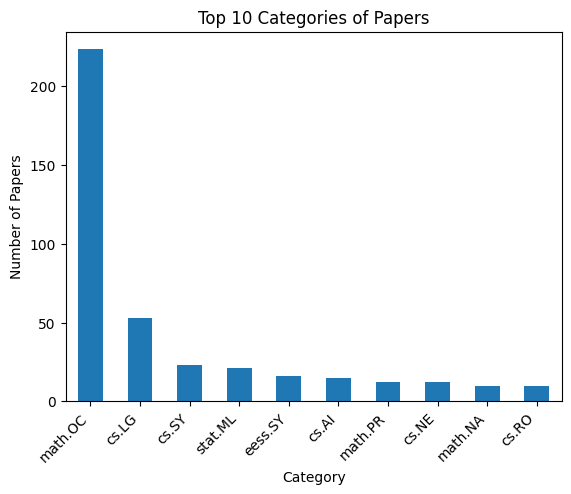

In [ ]:
query = """
SELECT Categories.term, COUNT(Article_Categories.article_id) AS category_count
FROM Categories
JOIN Article_Categories ON Categories.id = Article_Categories.category_id
GROUP BY Categories.term
ORDER BY category_count DESC
LIMIT 10
"""
df = pd.read_sql(query, conn)

# Plot the graph
plt.figure(figsize=(10, 6))
df.plot(kind='bar', x='term', y='category_count', legend=False)
plt.title('Top 10 Categories of Papers')
plt.xlabel('Category')
plt.ylabel('Number of Papers')
plt.xticks(rotation=45, ha='right')
plt.show()


### **Keyword Graph**

We use SQL query to fetch pairs of keywords that co-occur in the same paper. We create `networkx` graph is created with keywords as nodes. Nodes: Each node represents a keyword. An edge between two nodes represents that the two keywords co-occur in the same paper. The weight of the edge can represent how many times they appear together. The `spring_layout` function arranges nodes based on attractive and repulsive forces to make the graph visually clear.

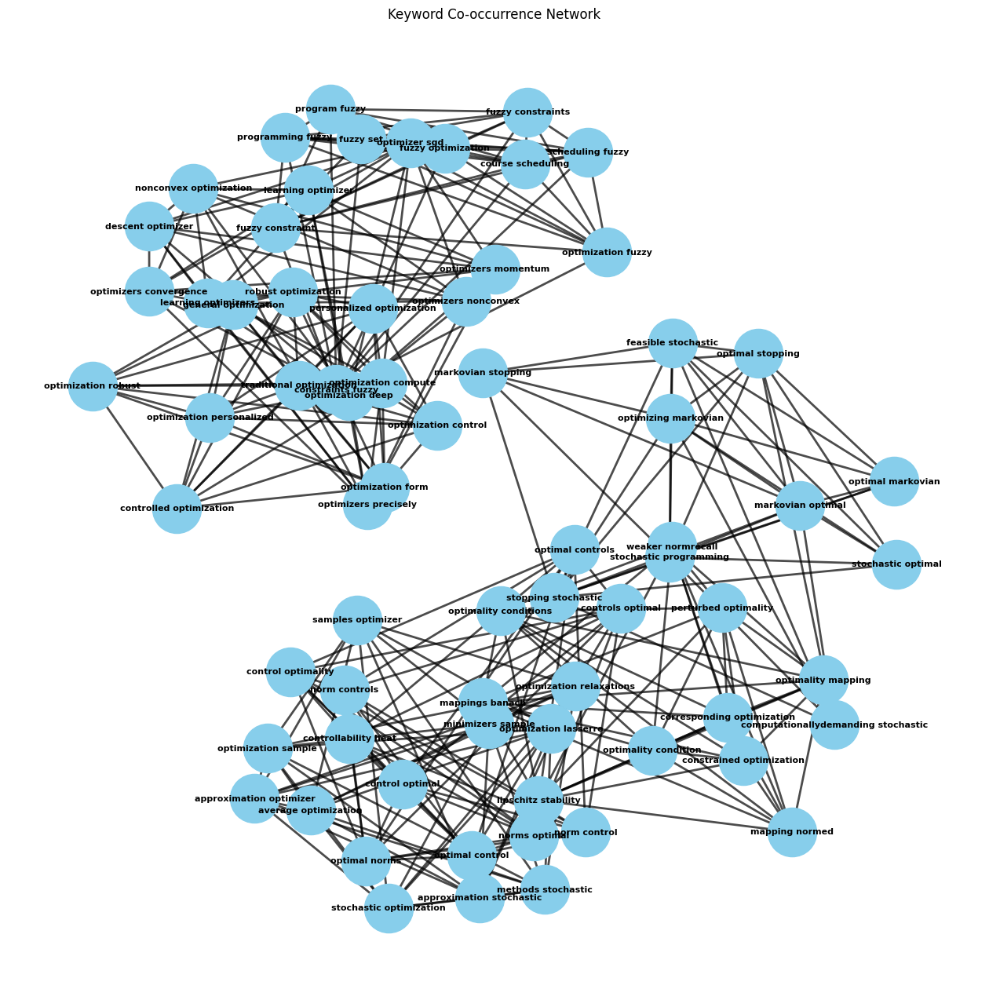

In [ ]:
import sqlite3
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


db_path = r"D:\Data_aqusition_en\database\research_papers.db"
# db_path = r"research_papers.db"

# Connect to SQLite database
conn = sqlite3.connect(db_path)

query = """
SELECT A1.keyword AS keyword_1, A2.keyword AS keyword_2
FROM Article_Keywords AS AK1
JOIN Article_Keywords AS AK2 ON AK1.article_id = AK2.article_id
JOIN Keywords AS A1 ON AK1.keyword_id = A1.id
JOIN Keywords AS A2 ON AK2.keyword_id = A2.id
WHERE A1.keyword != A2.keyword
LIMIT 600
"""
df = pd.read_sql(query, conn)

# Create a graph object
G = nx.Graph()


for _, row in df.iterrows():
    keyword_1 = row['keyword_1']
    keyword_2 = row['keyword_2']


    if G.has_edge(keyword_1, keyword_2):
        G[keyword_1][keyword_2]['weight'] += 1
    else:
        G.add_edge(keyword_1, keyword_2, weight=1)

# Draw the graph
plt.figure(figsize=(16, 16))
pos = nx.spring_layout(G, k=0.65, iterations=20)  # Layout for the graph
nx.draw_networkx_nodes(G, pos, node_size=2000, node_color="skyblue")
nx.draw_networkx_edges(G, pos, width=2.0, alpha=0.7)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight="bold", font_color="black")

# Add title and display
plt.title('Keyword Co-occurrence Network')
plt.axis('off')  # Hide axes
plt.show()


### **Most frequent Keywords and Word Cloud**

We retrieves article data from the Articles table, then extracts keywords associated with the articles from the Keywords and `Article_Keywords` tables, counting their frequencies. The 10 most common keywords are displayed in a bar chart and a word cloud

In [ ]:
import sys

!{sys.executable} -m pip install wordcloud

Colonnes : ['id', 'article_id', 'title', 'summary', 'published_date', 'updated_date', 'primary_category', 'doi', 'link', 'pdf_link']
the total number of extracted keywords : 2930

 10 most frequent keywords in the dataset :
optimal control: 47
convex optimization: 22
optimality conditions: 19
optimal controls: 15
optimality condition: 13
optimization methods: 13
control optimal: 12
bayesian optimization: 12
gradient descent: 12
optimal trajectory: 12


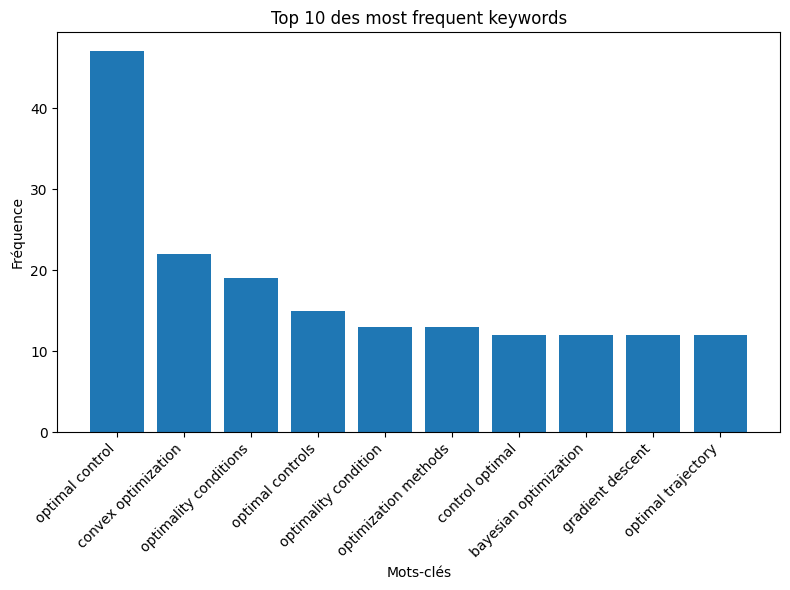

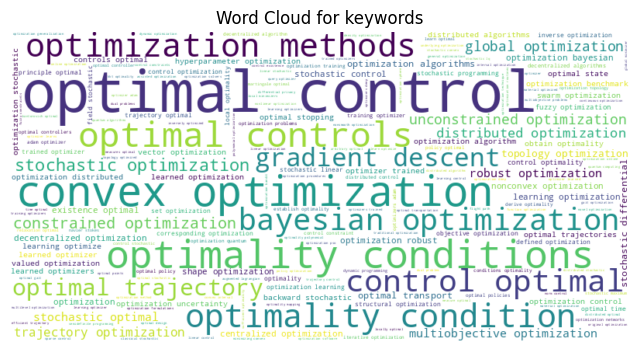

In [ ]:
import sqlite3
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter


db_path = r"D:\Data_aqusition_en\database\research_papers.db"
# db_path = r"research_papers.db"

# Connect to SQLite database
conn = sqlite3.connect(db_path)
cursor = conn.cursor()
cursor.execute("SELECT * FROM Articles")
rows = cursor.fetchall()

columns = [description[0] for description in cursor.description]
print("Colonnes :", columns)


# print("Contenu des Articles :")
# for row in rows:
#     print(row)


cursor.execute("SELECT k.keyword FROM Article_Keywords ak JOIN Keywords k ON ak.keyword_id = k.id")
keywords = [row[0] for row in cursor.fetchall()]
print(f"the total number of extracted keywords : {len(keywords)}")
keyword_counts = Counter(keywords)
print("\n 10 most frequent keywords in the dataset :")
for keyword, count in keyword_counts.most_common(10):
    print(f"{keyword}: {count}")

plt.figure(figsize=(8, 6))
top_keywords = dict(keyword_counts.most_common(10))
plt.bar(top_keywords.keys(), top_keywords.values())
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 des most frequent keywords")
plt.xlabel("Mots-clés")
plt.ylabel("Fréquence")
plt.tight_layout()
plt.show()

wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(keyword_counts)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud for keywords")
plt.show()




### **Co-authorship Network**

We retrieve the relationships between articles and authors from the `Article_Authors` and `Authors` tables.A dictionary is created mapping each article to its list of authors. Using this information, the code builds edges for a graph where each edge represents a co-authorship between two authors who worked on the same paper. A graph is constructed using the `networkx` library, and the co-authorship network is visualized with matplotlib, showing authors as nodes and co-authorships as edges.

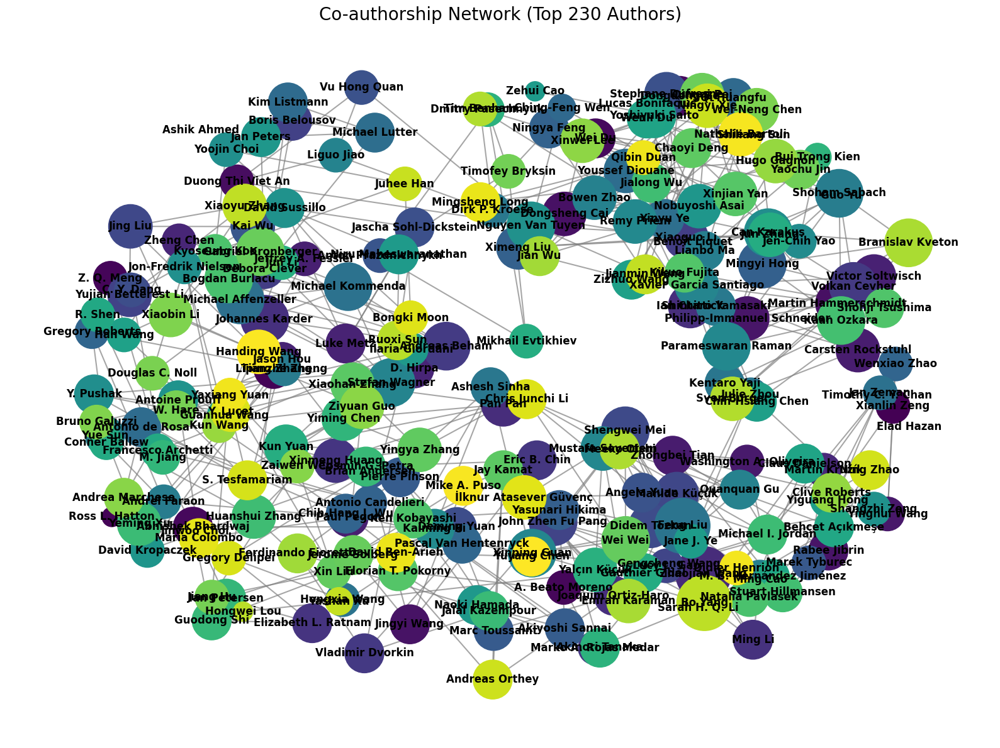

In [ ]:
import sqlite3
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict


# db_dir = r"D:\Data_aqusition_en\database"
# db_path = os.path.join(db_dir, "research_papers.db")
conn = sqlite3.connect(db_path)
cursor = conn.cursor()


cursor.execute("""
    SELECT aa.article_id, a.name
    FROM Article_Authors aa
    JOIN Authors a ON aa.author_id = a.id
""")
article_authors = cursor.fetchall()

# Map article IDs to their authors
article_to_authors = defaultdict(list)
for article_id, author_name in article_authors:
    article_to_authors[article_id].append(author_name)

# Build edges for the co-authorship graph
edges = []
for authors in article_to_authors.values():
    for i in range(len(authors)):
        for j in range(i + 1, len(authors)):
            edges.append((authors[i], authors[j]))

# Create the graph
G = nx.Graph()
G.add_edges_from(edges)

# Limit the number of authors to the top N by degree
N = 230
top_authors = sorted(G.degree, key=lambda x: x[1], reverse=True)[:N]
top_authors_names = {author[0] for author in top_authors}  # Get author names

# Create a subgraph with only the top authors
G_top = G.subgraph(top_authors_names)

# Customize the graph visualization
plt.figure(figsize=(16, 12))
pos = nx.spring_layout(G_top, k=0.5)  # Adjust layout spacing
node_sizes = [G_top.degree[node] * 500 for node in G_top.nodes]  # Size nodes by degree
node_colors = range(len(G_top.nodes))  # Assign different colors to nodes

# Draw nodes with custom size and color
nx.draw_networkx_nodes(G_top, pos, node_size=node_sizes, cmap=plt.cm.viridis, node_color=node_colors)

# Draw edges with transparency
nx.draw_networkx_edges(G_top, pos, alpha=0.7, edge_color="gray", width=1.5)

# Draw labels for nodes
nx.draw_networkx_labels(G_top, pos, font_size=12, font_color="black", font_weight="bold")

# Add title and remove axes
plt.title(f"Co-authorship Network (Top {N} Authors)", fontsize=20)
plt.axis("off")
plt.tight_layout()

# Display the graph
plt.show()

# Close the database connection
conn.close()



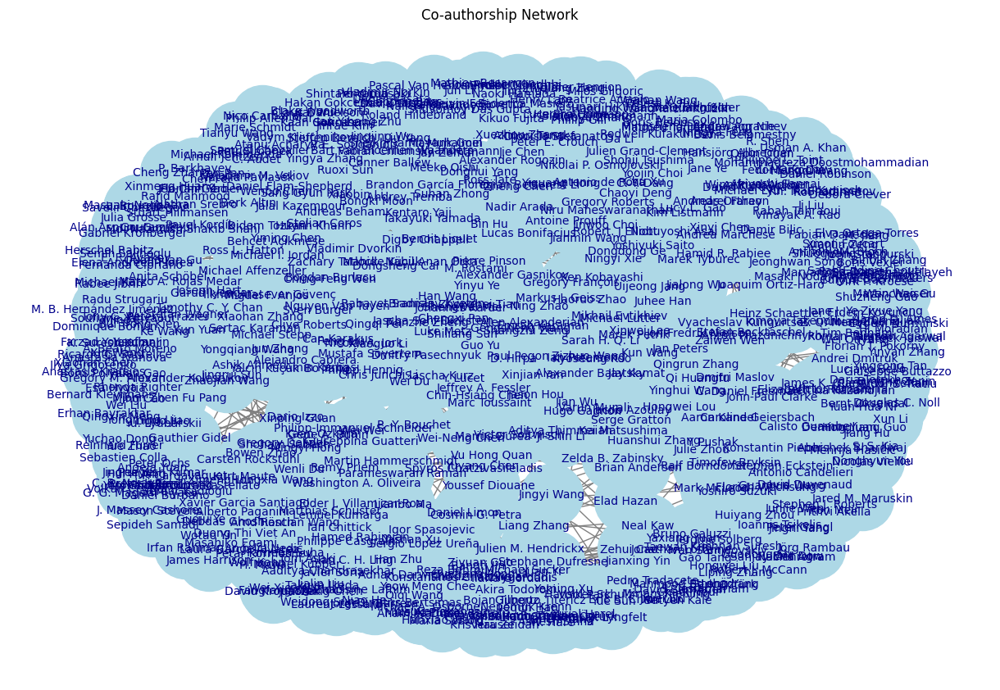

In [ ]:
import sqlite3
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# db_dir = r"D:\Data_aqusition_en\database"
# db_path = os.path.join(db_dir, "research_papers.db")
conn = sqlite3.connect(db_path)


cursor = conn.cursor()


cursor.execute("""
    SELECT aa.article_id, a.name
    FROM Article_Authors aa
    JOIN Authors a ON aa.author_id = a.id
""")
article_authors = cursor.fetchall()

article_to_authors = defaultdict(list)
for article_id, author_name in article_authors:
    article_to_authors[article_id].append(author_name)


edges = []
for authors in article_to_authors.values():
    for i in range(len(authors)):
        for j in range(i + 1, len(authors)):
            edges.append((authors[i], authors[j]))


G = nx.Graph()
G.add_edges_from(edges)


plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5)
nx.draw(
    G, pos, with_labels=True, node_size=3000, node_color="lightblue",
    font_size=10, font_color="darkblue", edge_color="gray"
)
plt.title("Co-authorship Network")
plt.show()

# Fermer la connexion
conn.close()